# Who was the Most Influential Artist? Creating and Analyzing a Network Graph of the Best Known Artists

### Kyle Waters - 2020

![Artist Network](2020network.png)

### It is common to hear things like "Pablo Picasso was the most dominant and influential artist of the first half of the 20th century." It is undeniable Picasso was an incredibly influential artist, but is there a way to visualize this? 

### A network graph is a great way to understand the structure of communities and the important people or hubs in that network of people or places. By forming connections between certain artists, we can better understand who is at the center and therefore, the most influential.    

### In this notebook, I use data on connections between artists to understand how communities of artists are related and visualize the most central -- and at least by this measure -- most influential artists.   

In [3]:
from matplotlib import pyplot as plt
import networkx as nx
import numpy as np
import pandas as pd

# 1. Data Source 

### I use information from ArtNet's "related artists" to build the network graph. Below is an example for Pablo Picasso. According to ArtNet's experts, Picasso is related to Georges Braque, Paul Cézanne, Juan Gris, Fernand Léger, and Henri Matisse.

![artnet](artnet.png)

In [127]:
#Load data
df_artists = pd.read_csv(r"C:\Users\kylej\Dropbox\Notebooks\artnet_artists.csv")

In [128]:
#Take a look at the data
df_artists.head(10)

,artnet_artist_name,related_artists,artist_birth,artist_death,artist_nationality,bio,exhibition_dates,exhibitions,public_collections,short_bio,related_categories
0,Pablo Picasso,"['Georges Braque', 'Paul Cézanne', 'Juan Gris'...",1881.0,1973.0,Spanish,\r\r\n Who Was Pabl...,"['2013', '2012', '2011', '2010', '2009', '2008...","[""Francisco Durrio - Museo de Bellas Artes de ...",[],Pablo Picasso was one of the most influential ...,"['19th-Century European and British Art', 'Dra..."
1,Andy Warhol,"['Jean-Michel Basquiat', 'Keith Haring', 'Jasp...",1928.0,1987.0,American,"\r\nAndy Warhol (American, 1928–1987) defined ...","['2013–2014', '2013', '2012', '2011', '2010', ...","['De Chirico / Warhol: Self-Portraits, Galerie...","['FAIF Collection, Zurich, Switzerland', ""Andy...",Andy Warhol was a leading figure in the Pop Ar...,"['Contemporary Art', 'Drawings and Works on Pa..."
2,Raoul Dufy,"['Guillaume Apollinaire', 'Marc Chagall', 'And...",1877.0,1953.0,French,"\r\nRaoul Dufy (French, 1877–1953) was a paint...","['2011', '2011', '2010', '2008', '2007', '2006...","['Raoul Dufy, projets de Tissus, Galerie Fanny...",[],Raoul Dufy was a French artist and designer wh...,"['Drawings and Works on Paper', 'Impressionist..."
3,Marc Chagall,"['Paul Cézanne', 'Vincent van Gogh', 'Wassily ...",1887.0,1985.0,French/Russian,"\r\n Marc Chagall (French/Russian, born July 7...","['2013', '2012', '2008', '2007', '2006', '1985...","['Chagall: entre guerre et paix, Musee Nationa...",[],Marc Chagall was a French-Russian artist whose...,"['Drawings and Works on Paper', 'Impressionist..."
4,Maximilien Luce,"['Eugene Froment', 'Léo Gausson', 'Georges Seu...",1858.0,1941.0,French,"\r\r\n A painter, l...",[],[],"['Museum d’Orsay, Paris', 'National Gallery, O...",Maximilien Luce was a French Neo-Impressionist...,"['19th-Century European and British Art', 'Imp..."
5,Auguste Rodin,"['Camille Claudel', 'Alberto Giacometti', 'Mic...",1840.0,1917.0,French,"\r\nAuguste Rodin (French, 1840–1917) is renow...","['2006–2007', '2006', '2005–2006', '2005–2006'...","['Sept. 23 - Jan. 1, ""Rodin"", Royal Academy of...",[],Auguste Rodin was a French artist widely regar...,['Sculpture']
6,Jules Pascin,"['Yasuo Kuniyoshi', 'Maurice Sterne', 'Alfred ...",1885.0,1930.0,French,"\r\nJules Pascin (French, 1885–1930) was a Bul...",[],[],[],Jules Pascin was a Bulgarian-born French Expre...,"['Drawings and Works on Paper', 'Impressionist..."
7,Lucio Fontana,"['Enrico Castellani', 'Dadamaino', 'Mark Rothk...",1899.0,1968.0,Argentine/Italian,"\r\nLucio Fontana (Argentine/Italian, 1899–196...","['2013', '2012', '2011', '2010', '2009', '2008...","['[school of] Lucie Fontaine, Artport, Tel Avi...","[""Museum of Modern Art, New York , NYMuseum of...",Lucio Fontana was an Argentine-Italian artist ...,"['Contemporary Art', 'Drawings and Works on Pa..."
8,Gen Paul,NaN,1895.0,1975.0,French,"\r\nGen Paul (French, 1895–1975) was a painter...","['1952', '1937', '1928', '1920', '']","['Restrospective, Galerie Drouant-David', 'Pai...",[],NaN,NaN
9,Victor Vasarely,"['Josef Albers', 'Alexander Calder', 'Julio Le...",1906.0,1997.0,French/Hungarian,"\r\n Victor Vasarely (French/Hungarian, 1906–1...","['2013', '2012', '2011', '2010', '2009', '2008...",['Dynamo Un Siecle De Lumiere Et De Mouvement ...,[],Victor Vasarely was a French-Hungarian artist ...,"['Contemporary Art', 'Pop Art', 'Prints and Mu..."


### The raw data needs to be converted to a form where I can make the graph. Below, I filter down the data to where the related artists information is available, and create a dataframe with pairings (the network's edges) of artists.

In [ ]:
df_artists2 = df_artists[pd.notnull(df_artists["related_artists"])]
df_artists2["related_artists"] = df_artists2.related_artists.apply(lambda x: x.strip("[]").replace("'","").split(", ")) 
df_artists2["List_Flag"] = df_artists2.related_artists.apply(lambda x: True if type(x) == list else False)
df_artists_w_related = df_artists2[df_artists2["List_Flag"]]
df_artists_w_related["artnet_artist_name"] = df_artists_w_related["artnet_artist_name"].str.strip()

In [130]:
#Create pairings
df_pairs = pd.DataFrame()
row = 0
for artist in df_artists_w_related.itertuples():
    
    artist_ = artist.artnet_artist_name
    related = artist.related_artists
    
    for related_artist in related:
        
        df_pairs.loc[row, "From"] = artist_
        df_pairs.loc[row, "To"] = related_artist.strip()
        row+=1 

df_pairs = df_pairs.drop_duplicates()

# 2. Building a Network

## I use the popular python library networkx to create the graph. First, I include all nodes (artists) and edges (relations between artists) 

In [245]:
#Generate a graph from the dataframe
G=nx.Graph()
G=nx.from_pandas_edgelist(df_pairs, 'From', 'To')

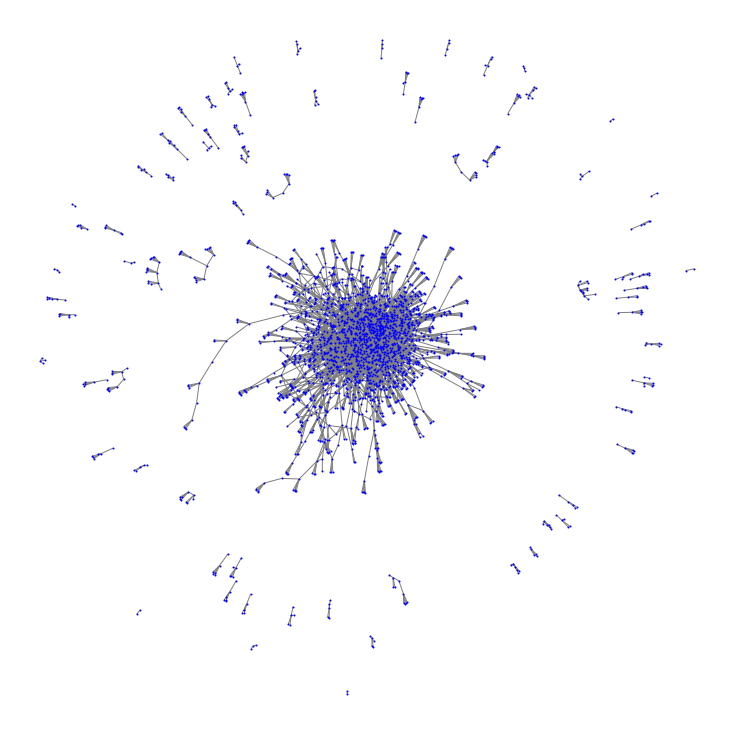

In [132]:
#Spring layout
pos = nx.spring_layout(G)
fig = plt.figure(figsize=(10, 10))
nx.draw(G, with_labels=False, node_color='Blue', node_size=1, edge_color='grey', pos=pos) 

In [136]:
# The nodes attribute of the graph tells us how many artists are in this graph
print("There are {:,} artists in this graph.".format(len(G.nodes())))

There are 2,477 artists in this graph.


## Observations

### Interestingly, there are many self-contained / fringe groups that seem to be disconnected from the main cluster of artists. Looking within the main cluster, it is difficult to make out the most important artists, or certain communities/artistic movements.   

### To measure influence, we look at how many other artists are connected to a particular artist (known as the "degree"). Below are the artists with degree > 20.

In [155]:
for artist in G.nodes():
    
    if G.degree(artist) > 20:
        print("{} has degree {}.".format(artist,G.degree(artist)))

Pablo Picasso has degree 54.
Paul Cézanne has degree 38.
Henri Matisse has degree 37.
Andy Warhol has degree 37.
Vincent van Gogh has degree 24.
Wassily Kandinsky has degree 23.
Mark Rothko has degree 29.
Helen Frankenthaler has degree 22.
Willem de Kooning has degree 32.
Claude Monet has degree 29.
Paul Klee has degree 27.
Jackson Pollock has degree 33.
Edward Hopper has degree 27.


### Picasso is connected to 54 other artists, which is the highest degree in this network. However, it is tough to see this in the network above due to the disconnected components. To improve the analysis, I'll focus in on the main cluster of artists. To do this, I'll exclude the groups of artists of 20 or less.

# 3. Focused Network of Artists Removing Outer Components

In [246]:
#Remove groups with less than 20 artists in them 
for component in list(nx.connected_components(G)):
    if len(component)<20:
        for node in component:
            G.remove_node(node)

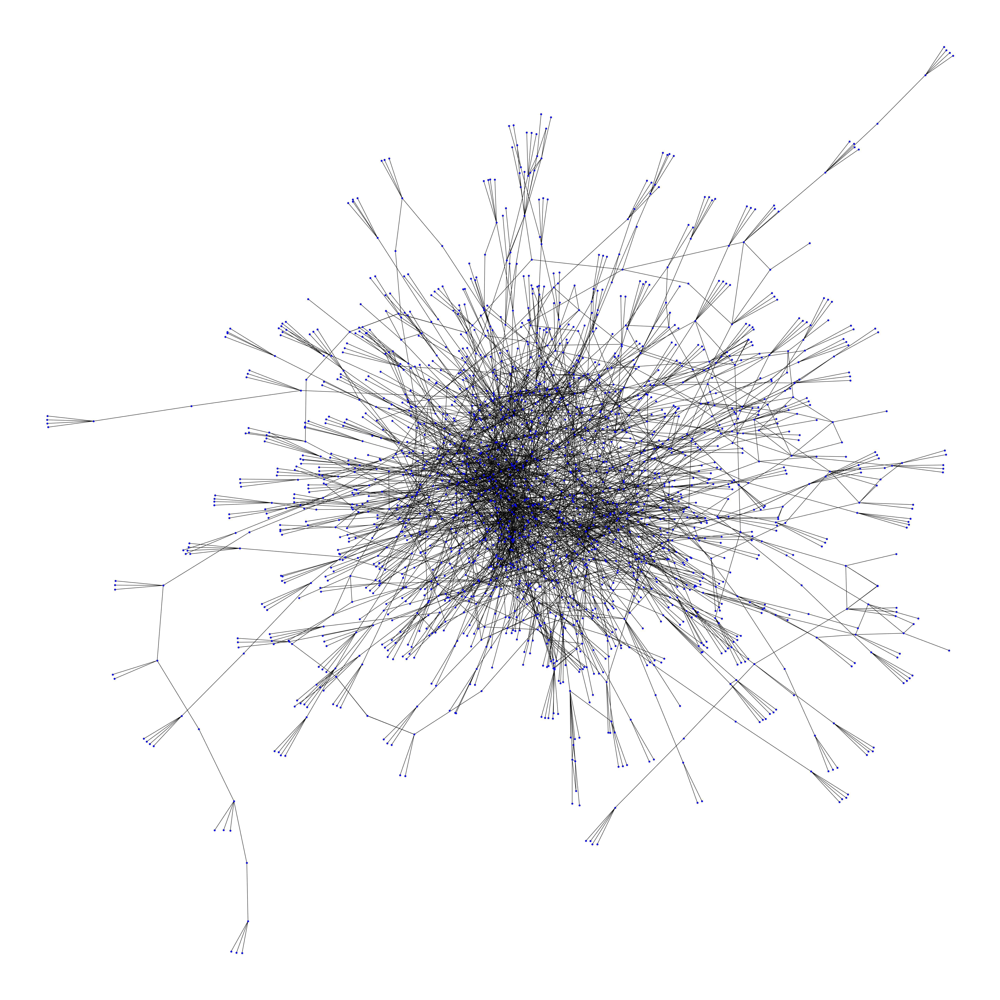

In [173]:
#Spring layout
pos = nx.spring_layout(G)
fig = plt.figure(figsize=(80, 80))
nx.draw(G, with_labels=False, node_color='Blue', node_size=100, edge_color='black', pos=pos,width=2) 

## This graph now focuses in on the main cluster. Next, I'll try to measure centralitity by weighting the node sizes by degree.

# 4. Weighting node size by Degree

In [174]:
degree = nx.degree_centrality(G)
values = [degree.get(node)*100000 for node in G.nodes()]

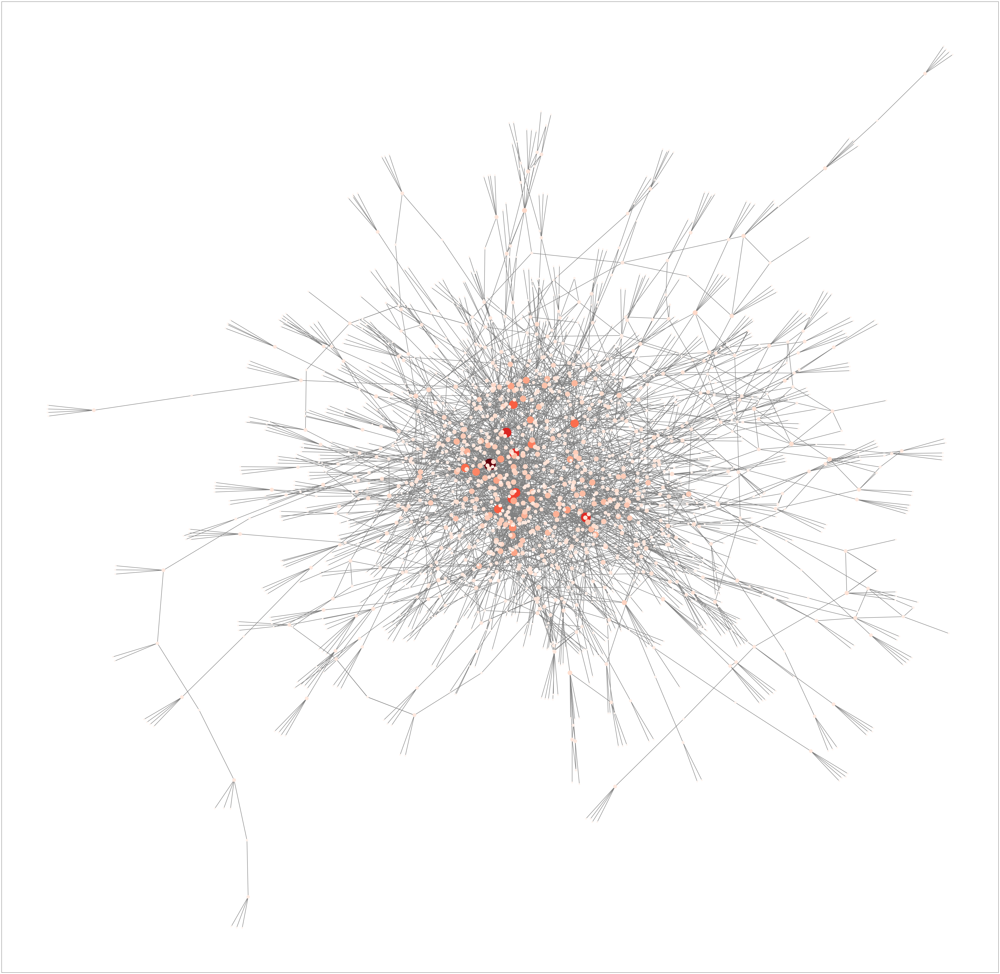

In [175]:
fig, ax = plt.subplots(figsize=(80,80))
nx.draw_networkx(G, 
                 cmap = plt.get_cmap('Reds'),pos=pos,
                 node_color = values, node_size=values,
                 width=2, edge_color='grey', with_labels=False)
ylims = ax.get_ylim()
xlims = ax.get_xlim()

#ax.set_ylim(ylims[0]+.40,ylims[1]-.40)
#ax.set_xlim(xlims[0]+.40,xlims[1]-.40)

## Above we can see the most central artists, but is hard to make any conclusions on they relate to communities of artists. I'll make a further improvement of removing nodes with degree of less than or equal to 5.

# 5. Refining the Network Down 

In [247]:
#Remove nodes with degree <=5
nodes_degree_less6 = [x for x in G.nodes() if G.degree(x) <= 5]
print("Removing {} nodes".format(len(nodes_degree_less6)))
for node in nodes_degree_less6:
    G.remove_node(node)

Removing 1660 nodes


In [248]:
#Remove groups with less than 20 artists in them 
for component in list(nx.connected_components(G)):
    if len(component)<20:
        for node in component:
            G.remove_node(node)

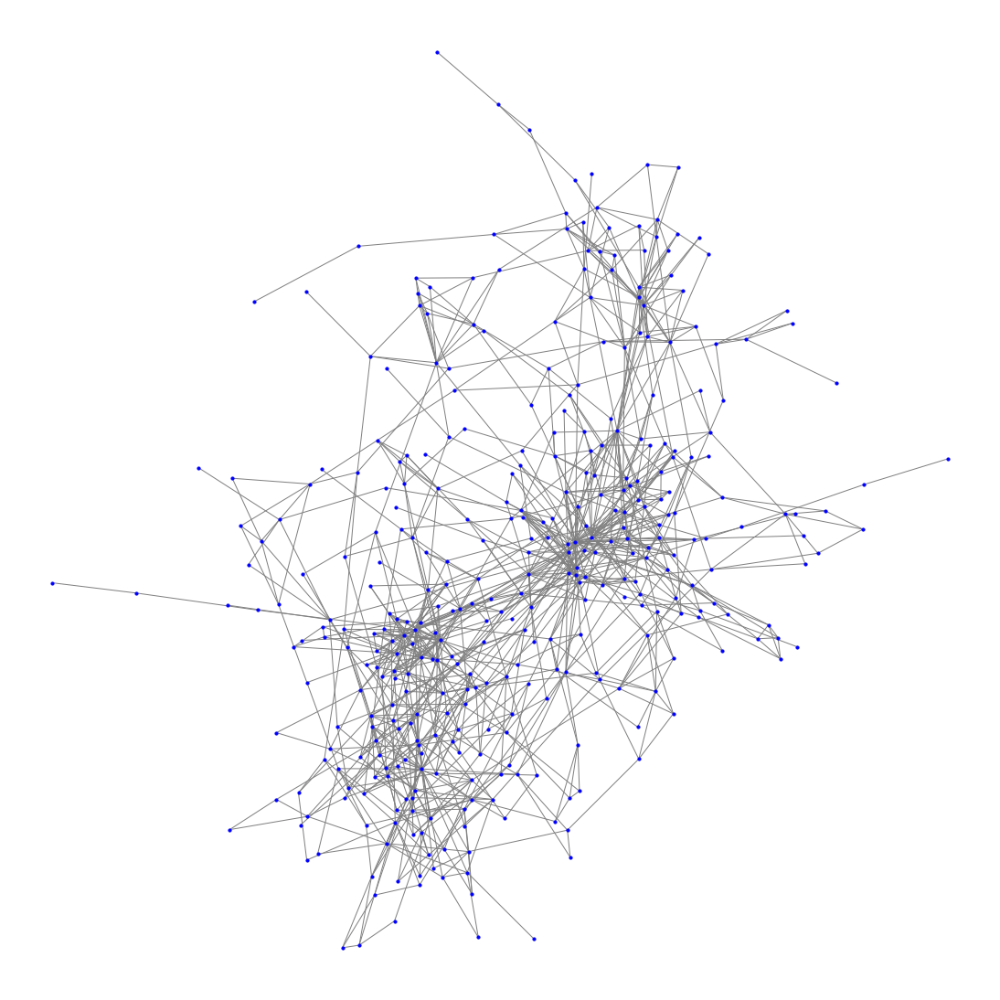

In [194]:
#Spring layout
pos = nx.spring_layout(G)
fig = plt.figure(figsize=(15, 15))
nx.draw(G, pos=pos, with_labels=False, node_color='Blue', node_size=10, edge_color='grey', width=1) 

## After removing those nodes, communities in the network start to emerge. Let's weight and label the nodes again to see if there is a pattern or we can distinguish which community fits to an artistic movement.

## I'll label the nodes if the degree of that artists is > 15

In [215]:
nodes_over_15 = [x for x in G.nodes() if G.degree(x) > 15]
degree = nx.degree_centrality(G)
values = [degree.get(node)*1000 for node in G.nodes()]

{'Pablo Picasso': Text(0.11611353560358997, 0.05738880999686085, 'Pablo Picasso'),
 'Paul Cézanne': Text(0.19529184313300385, 0.27153059588589573, 'Paul Cézanne'),
 'Henri Matisse': Text(0.14737452260073922, 0.06590738952610262, 'Henri Matisse'),
 'Andy Warhol': Text(-0.1735852421539939, -0.3788664805272132, 'Andy Warhol'),
 'Wassily Kandinsky': Text(0.1044120067770554, -0.002900406099090282, 'Wassily Kandinsky'),
 'Mark Rothko': Text(-0.207073569760124, -0.12214303069878991, 'Mark Rothko'),
 'Willem de Kooning': Text(-0.18559764713594235, -0.11099088832008262, 'Willem de Kooning'),
 'Claude Monet': Text(0.24467472581875668, 0.5126151015729824, 'Claude Monet'),
 'Jackson Pollock': Text(-0.13798345696754435, -0.13139288312903047, 'Jackson Pollock')}

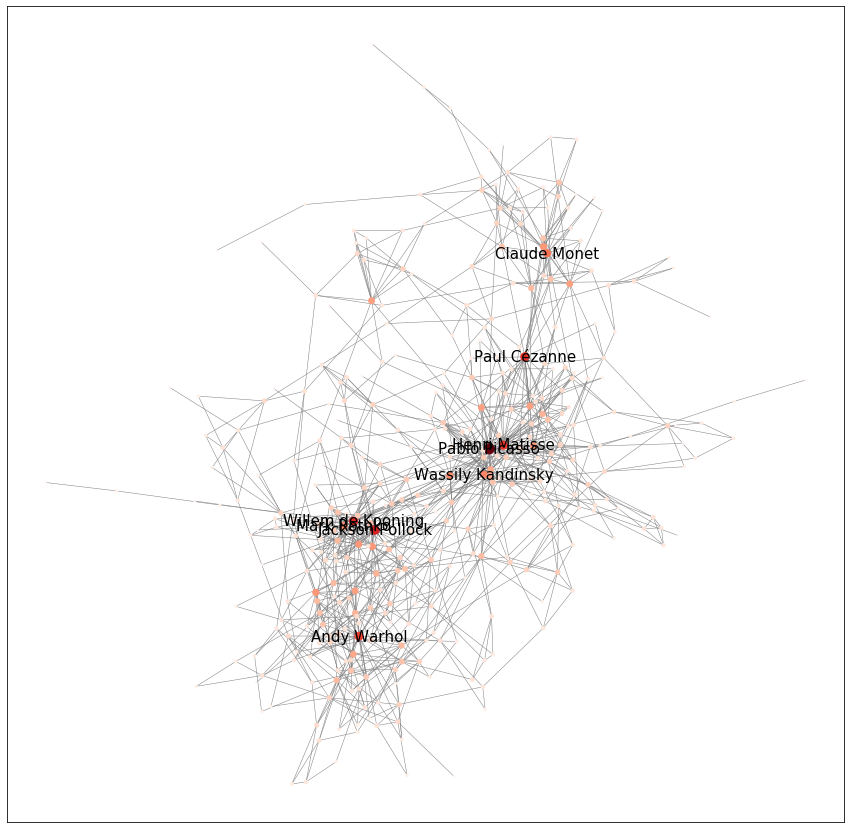

In [216]:
labels = {}    
for node in G.nodes():
    if node in nodes_over_15:
        #set the node name as the key and the label as its value 
        labels[node] = node

fig, ax = plt.subplots(figsize=(15,15))
nx.draw_networkx(G, pos=pos,
                 cmap = plt.get_cmap('Reds'),
                 node_color = values, node_size=values,
                 width=0.5, edge_color='grey', with_labels=False,font_size=30)
nx.draw_networkx_labels(G,pos, labels,font_size=15,font_color='black')

## We see that the nodes are roughly in their own communities. 

## Monet is the "hub" of the Impressionists, Cezanne the center of the Post-Impressionists, Matisse/Picasso the centers of Early Modern Art, de Kooning and Pollock the centers of Modern Art, and Warhol the center of Contemporary Art.

# 6. Coloring Nodes by Artist Year of Birth

In [249]:
birth_years = []
nodes_remove = []
for artist in G.nodes:
    #print(artist)
    try:
        
        birth = df_artists_w_related[df_artists_w_related.artnet_artist_name == artist]["artist_birth"].iloc[0]
        
        #remove outliers
        if birth > 1700:
            birth_years.append(birth)
        else:
            nodes_remove.append(artist)
    except:
        nodes_remove.append(artist)

for artist in nodes_remove:
    G.remove_node(artist)

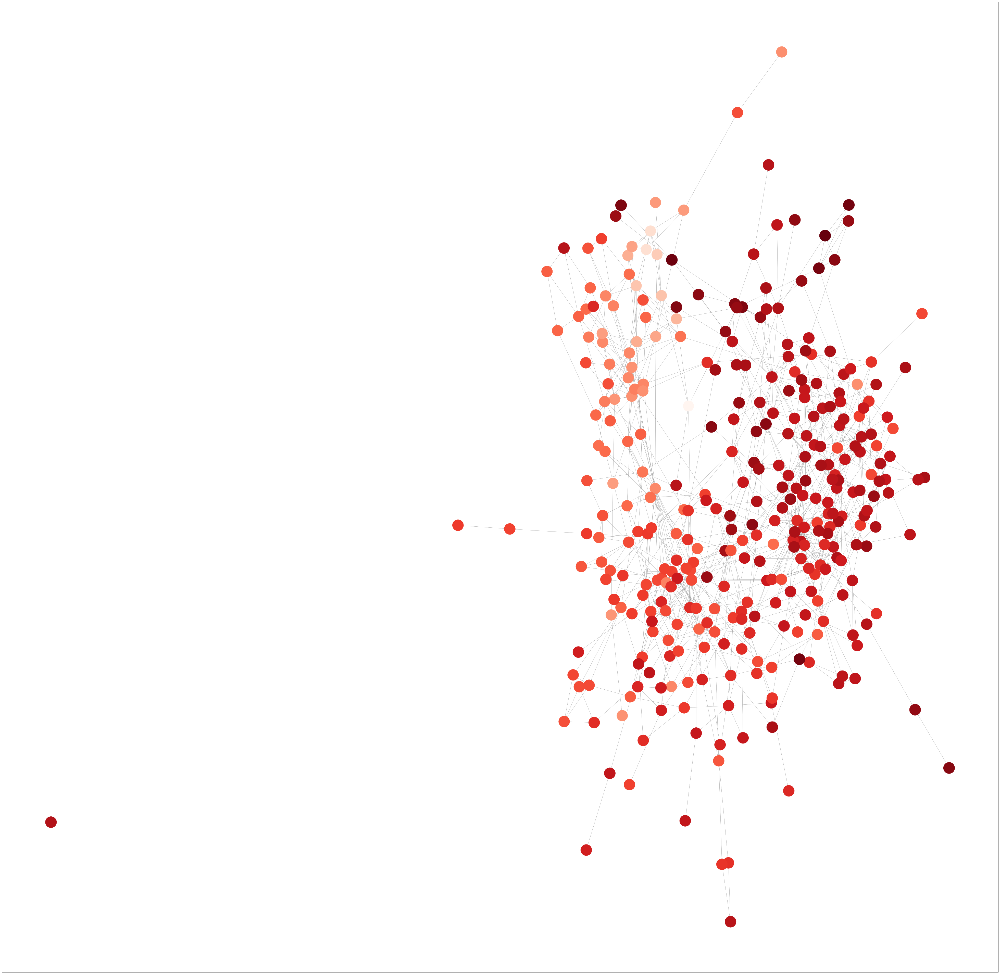

In [253]:
pos = nx.spring_layout(G)
fig, ax = plt.subplots(figsize=(70,70))
nx.draw_networkx(G, pos=pos,
                 cmap = plt.get_cmap('Reds'),
                 node_color = birth_years, node_size=birth_years,
                 width=0.5, edge_color='grey', with_labels=False,font_size=30)

In [254]:
df_artists_w_related

,artnet_artist_name,related_artists,artist_birth,artist_death,artist_nationality,bio,exhibition_dates,exhibitions,public_collections,short_bio,related_categories,List_Flag
0,Pablo Picasso,"[Georges Braque, Paul Cézanne, Juan Gris, Fern...",1881.0,1973.0,Spanish,\r\r\n Who Was Pabl...,"['2013', '2012', '2011', '2010', '2009', '2008...","[""Francisco Durrio - Museo de Bellas Artes de ...",[],Pablo Picasso was one of the most influential ...,"['19th-Century European and British Art', 'Dra...",True
1,Andy Warhol,"[Jean-Michel Basquiat, Keith Haring, Jasper Jo...",1928.0,1987.0,American,"\r\nAndy Warhol (American, 1928–1987) defined ...","['2013–2014', '2013', '2012', '2011', '2010', ...","['De Chirico / Warhol: Self-Portraits, Galerie...","['FAIF Collection, Zurich, Switzerland', ""Andy...",Andy Warhol was a leading figure in the Pop Ar...,"['Contemporary Art', 'Drawings and Works on Pa...",True
2,Raoul Dufy,"[Guillaume Apollinaire, Marc Chagall, André De...",1877.0,1953.0,French,"\r\nRaoul Dufy (French, 1877–1953) was a paint...","['2011', '2011', '2010', '2008', '2007', '2006...","['Raoul Dufy, projets de Tissus, Galerie Fanny...",[],Raoul Dufy was a French artist and designer wh...,"['Drawings and Works on Paper', 'Impressionist...",True
3,Marc Chagall,"[Paul Cézanne, Vincent van Gogh, Wassily Kandi...",1887.0,1985.0,French/Russian,"\r\n Marc Chagall (French/Russian, born July 7...","['2013', '2012', '2008', '2007', '2006', '1985...","['Chagall: entre guerre et paix, Musee Nationa...",[],Marc Chagall was a French-Russian artist whose...,"['Drawings and Works on Paper', 'Impressionist...",True
4,Maximilien Luce,"[Eugene Froment, Léo Gausson, Georges Seurat, ...",1858.0,1941.0,French,"\r\r\n A painter, l...",[],[],"['Museum d’Orsay, Paris', 'National Gallery, O...",Maximilien Luce was a French Neo-Impressionist...,"['19th-Century European and British Art', 'Imp...",True
...,...,...,...,...,...,...,...,...,...,...,...,...
5839,El Greco,"[Caravaggio, Francisco Goya, Peter Paul Rubens...",1541.0,1614.0,Greek,NaN,[],[],[],El Greco was a Greek-born Spanish artist known...,['Old Masters'],True
5890,Ruth Bloch,[Alberto Giacometti],1951.0,NaN,Israeli,NaN,[],[],[],Ruth Bloch is an Israeli artist known for her ...,"['Contemporary Art', 'Sculpture']",True
5892,Peter Lanyon,"[Barbara Hepworth, Robert Motherwell, Ben Nich...",1918.0,1964.0,British,NaN,"['1992', '1991', '1984–1985', '1983', '1981', ...","['Air, Land and Sea, South Bank Centre, London...",[],Peter Lanyon was a British artist who created ...,"['Contemporary Art', 'Drawings and Works on Pa...",True
5946,Arnulf Rainer,"[Marlene Dumas, Uno Hoffmann, Ernst Wilhelm Na...",1929.0,NaN,Austrian,"\r\nArnulf Rainer (Austrian, b.1929) is consid...","['2013', '2010', '2010', '2010', '2009–2010', ...",['TEA Tenerife Espacio de las Artes Horizontes...,"['Art Institute of Chicago, Chicago, IL Museum...",Arnulf Rainer is an Austrian artist known for ...,['Impressionist and Modern Art'],True


# 7. Conclusions

## At least by this measure, Picasso seems to be a key link in between art movements and we can visually see why so many people attribute him to influencing many others in the late half of the 20th century. 